# Telecom Churn Case Study

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :
1. Good Phase (6 & 7th month)
2. Action Phase (8th month)
3. Churn Phase (9th month)

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months.

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

## Data Preparation

In [2]:
data = pd.read_csv('telecom_churn_data.csv')
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [3]:
data.shape

(99999, 226)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


### We have 179 float, 35 integer and 12 object columns.

In [5]:
print(sorted(data.columns.tolist()))

['aon', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'aug_vbc_3g', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'circle_id', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'ic_others_9', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'isd_ic_mou_9', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'isd_og_mou_9', 'jul_vbc_3g', 'jun_vbc_3g', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'last_day_rch

In [6]:
null_cols = []
for col in data.columns:
    if data[col].isnull().any():
        null_cols.append(col)

In [7]:
len(null_cols)

166

### Out of 226 columns we have 166 null columns

In [8]:
round(100*(data.isnull().sum()/len(data.index)), 2)

mobile_number     0.00
circle_id         0.00
loc_og_t2o_mou    1.02
std_og_t2o_mou    1.02
loc_ic_t2o_mou    1.02
                  ... 
aon               0.00
aug_vbc_3g        0.00
jul_vbc_3g        0.00
jun_vbc_3g        0.00
sep_vbc_3g        0.00
Length: 226, dtype: float64

### Before proceeding further with the data, we will first filter the high value customers who generated approximately 80% of revenues.
The criteria to find high value customers are
Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

Average recharge amount columns for the first 2 months can be figured out by taking the average of total recharge amount of the following columns.
1. total_rech_amt_6
2. total_rech_amt_7

We will create a new column 'avg_recharge_good_phase'

In [9]:
data['avg_recharge_good_phase'] = (data['total_rech_amt_6'] + data['total_rech_amt_7'])/2

#### We will find the various percentiles of the new column

In [10]:
data['avg_recharge_good_phase'].describe()

count    99999.000000
mean       325.238792
std        370.833466
min          0.000000
25%        115.000000
50%        229.000000
75%        419.000000
max      37762.500000
Name: avg_recharge_good_phase, dtype: float64

#### To find the 70th percentile

In [11]:
data['avg_recharge_good_phase'].quantile([0.5, 0.7])

0.5    229.0
0.7    368.5
Name: avg_recharge_good_phase, dtype: float64

### We will filter the high value customers where avg_recharge in good phase is greater than or equal to 368.5

In [12]:
data_hv = data[data['avg_recharge_good_phase'] >= data['avg_recharge_good_phase'].quantile([0.7]).values[0]]

In [13]:
data_hv.shape

(30011, 227)

#### We have approximately 30000 records of high value customers

### Tag churners and remove attributes of the churn phase
Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:

1. total_ic_mou_9
2. total_og_mou_9
3. vol_2g_mb_9
4. vol_3g_mb_9

After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

In [14]:
data_hv['total_ic_mou_9'].isnull().any()

np.False_

In [15]:
data_hv['total_ic_mou_9'].describe()

count    30011.000000
mean       277.505207
std        356.498986
min          0.000000
25%         63.620000
50%        176.190000
75%        360.695000
max       7785.730000
Name: total_ic_mou_9, dtype: float64

In [16]:
data_hv['total_og_mou_9'].isnull().any()

np.False_

In [17]:
data_hv['total_og_mou_9'].describe()

count    30011.000000
mean       562.667771
std        654.205634
min          0.000000
25%        136.375000
50%        383.090000
75%        757.170000
max      11140.110000
Name: total_og_mou_9, dtype: float64

In [18]:
data_hv['vol_2g_mb_9'].isnull().any()

np.False_

In [19]:
data_hv['vol_2g_mb_9'].describe()

count    30011.000000
mean        62.255936
std        244.480322
min          0.000000
25%          0.000000
50%          0.000000
75%          6.350000
max       8993.950000
Name: vol_2g_mb_9, dtype: float64

In [20]:
data_hv['vol_3g_mb_9'].isnull().any()

np.False_

In [21]:
data_hv['vol_3g_mb_9'].describe()

count    30011.000000
mean       271.587772
std        895.999227
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      39221.270000
Name: vol_3g_mb_9, dtype: float64

#### All the above columns are having 0 as min and there are no null values.

### We will now create a churn column with values 1 and 0.
- 1 - Values with all columns with zero
- 2 - Values with any columns without zero

In [22]:
def find_churn(data):
    if (data['total_ic_mou_9'] == 0 and data['total_og_mou_9'] == 0 and data['vol_2g_mb_9'] == 0 and data['vol_3g_mb_9'] == 0):
        return 1
    else:
        return 0
data_hv['churn'] = data_hv[['total_ic_mou_9', 'total_og_mou_9', 'vol_2g_mb_9', 'vol_3g_mb_9']].apply(find_churn, axis=1)

In [23]:
data_hv[data_hv['churn'] == 1][['total_ic_mou_9', 'total_og_mou_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'churn']].head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,churn
7,0.0,0.0,0.0,0.0,1
97,0.0,0.0,0.0,0.0,1
111,0.0,0.0,0.0,0.0,1
143,0.0,0.0,0.0,0.0,1
188,0.0,0.0,0.0,0.0,1


In [24]:
data_hv[data_hv['churn'] == 0][['total_ic_mou_9', 'total_og_mou_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'churn']].head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,churn
8,34.91,142.18,0.0,0.0,0
13,631.86,446.09,0.0,0.0,0
16,334.56,255.74,0.0,0.0,0
17,87.13,631.08,0.0,0.0,0
21,252.61,1031.53,0.0,0.0,0


### We need to remove all the attributes corresponding to the churn phase.
We will find the columns ending with '_9' and drop it.

In [25]:
columns_ending_with_9 = data_hv.filter(regex='_9$').columns

print(columns_ending_with_9)

Index(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9',
       'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9',
       'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9',
       'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9',
       'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9',
       'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9',
       'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9',
       'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
       'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9',
       'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9',
       'night_pck_user

In [26]:
len(columns_ending_with_9)

54

In [27]:
data_hv.shape

(30011, 228)

In [28]:
data_hv.drop(columns_ending_with_9, axis=1, inplace=True)

In [29]:
data_hv.shape

(30011, 174)

#### 54 columns got dropped. 228 - 54 = 174 columns are remaining.

In [30]:
round(100*(data_hv.isnull().sum()/len(data.index)), 2)

mobile_number              0.00
circle_id                  0.00
loc_og_t2o_mou             0.11
std_og_t2o_mou             0.11
loc_ic_t2o_mou             0.11
                           ... 
jul_vbc_3g                 0.00
jun_vbc_3g                 0.00
sep_vbc_3g                 0.00
avg_recharge_good_phase    0.00
churn                      0.00
Length: 174, dtype: float64

In [31]:
# Get columns where more than 40% of values are null
null_threshold = 0.4 * len(data_hv)  # 40% of the total rows

# Filter columns with null values greater than the threshold
columns_with_40_nulls = data_hv.columns[data_hv.isnull().sum() > null_threshold]

print(columns_with_40_nulls)

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8',
       'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'night_pck_user_6',
       'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7',
       'fb_user_8'],
      dtype='object')


In [32]:
len(columns_with_40_nulls)

30

In [33]:
data_hv.drop(columns_with_40_nulls, axis=1, inplace=True)

In [34]:
data_hv.shape

(30011, 144)

### We will find out the remaining columns with null values

In [35]:
null_cols = []
for column in data_hv.columns:
    if data_hv[column].isnull().any():
        null_cols.append(column)
        count = data_hv[column].isnull().sum()
        percentage = round(100*(data_hv[column].isnull().sum()/len(data_hv.index)), 2)
        print("Column name: {}, percentage: {}, count: {}".format(column, percentage, count))

Column name: loc_og_t2o_mou, percentage: 0.38, count: 114
Column name: std_og_t2o_mou, percentage: 0.38, count: 114
Column name: loc_ic_t2o_mou, percentage: 0.38, count: 114
Column name: last_date_of_month_7, percentage: 0.1, count: 31
Column name: last_date_of_month_8, percentage: 0.52, count: 157
Column name: onnet_mou_6, percentage: 1.05, count: 316
Column name: onnet_mou_7, percentage: 1.01, count: 303
Column name: onnet_mou_8, percentage: 3.13, count: 938
Column name: offnet_mou_6, percentage: 1.05, count: 316
Column name: offnet_mou_7, percentage: 1.01, count: 303
Column name: offnet_mou_8, percentage: 3.13, count: 938
Column name: roam_ic_mou_6, percentage: 1.05, count: 316
Column name: roam_ic_mou_7, percentage: 1.01, count: 303
Column name: roam_ic_mou_8, percentage: 3.13, count: 938
Column name: roam_og_mou_6, percentage: 1.05, count: 316
Column name: roam_og_mou_7, percentage: 1.01, count: 303
Column name: roam_og_mou_8, percentage: 3.13, count: 938
Column name: loc_og_t2t_m

In [36]:
len(null_cols)

95

### We have 95 columns with null values.
#### Firstly, we will handle the date columns with null values.
Columns are
- last_date_of_month_7
- last_date_of_month_8
- date_of_last_rech_6
- date_of_last_rech_7
- date_of_last_rech_8

In [37]:
data_hv['last_date_of_month_7'].value_counts()

last_date_of_month_7
7/31/2014    29980
Name: count, dtype: int64

In [38]:
data_hv['last_date_of_month_8'].value_counts()

last_date_of_month_8
8/31/2014    29854
Name: count, dtype: int64

#### The above columns are having single value which is not helpful for us as there is no variance and predictive power. We can remove this column

In [39]:
data_hv['last_date_of_month_6'].value_counts()

last_date_of_month_6
6/30/2014    30011
Name: count, dtype: int64

#### We can drop last_date_of_month_6 also 

In [40]:
data_hv.drop(['last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_6'], axis=1, inplace=True)

#### We can replace with the remaining date columns with the mode value
- Column name: date_of_last_rech_6, percentage: 0.21, count: 62
- Column name: date_of_last_rech_7, percentage: 0.38, count: 114
- Column name: date_of_last_rech_8, percentage: 1.98, count: 594

In [41]:
from sklearn.impute import SimpleImputer
mode_imputation = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

In [42]:
data_hv['date_of_last_rech_6'] = mode_imputation.fit_transform(data_hv[['date_of_last_rech_6']]).ravel()
data_hv['date_of_last_rech_7'] = mode_imputation.fit_transform(data_hv[['date_of_last_rech_7']]).ravel()
data_hv['date_of_last_rech_8'] = mode_imputation.fit_transform(data_hv[['date_of_last_rech_8']]).ravel()

In [43]:
data_hv['date_of_last_rech_6'].isnull().any()

np.False_

In [44]:
data_hv['date_of_last_rech_7'].isnull().any()

np.False_

In [45]:
data_hv['date_of_last_rech_8'].isnull().any()

np.False_

#### Remove categorical columns from our list

In [46]:
null_cols = [col for col in null_cols if col not in ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'last_date_of_month_7', 'last_date_of_month_8']]
len(null_cols)

90

In [47]:
list(set(data_hv[null_cols].select_dtypes(include=['object']).columns))

[]

### All the remaining null columns are of type float or int. We will replace it with the mean.
We can use the SimpleImputer here to replace it with the mean

In [48]:
mean_imputation = SimpleImputer(missing_values=np.nan, strategy='mean')

In [49]:
for col in null_cols:
    data_hv[col] = mean_imputation.fit_transform(data_hv[[col]]).ravel()

### We will verify if all the null values are removed.

In [50]:
null_cols = []
for column in data_hv.columns:
    if data_hv[column].isnull().any():
        null_cols.append(column)
null_cols

[]

#### All the null values are imputed or removed.

#### We can find the outliers and remove it using the below code, but currenlty we are not removing outliers as we think those customers who are having high numbers should also be considered and if we use RandomForest which is a robust model that can handle outliers effectively due to its structure and the way it builds decision trees.

Adding the code to remove outliers as commented for reference.

In [378]:
# Q1 = data_hv.quantile(0.25)
# Q3 = data_hv.quantile(0.75)
# IQR = Q3 - Q1

# Filter the data to remove outliers based on the IQR method
# data_hv_no_outliers = data_hv[~((data_hv < (Q1 - 1.5 * IQR)) | (data_hv > (Q3 + 1.5 * IQR))).any(axis=1)]

## Derive features
-------------------
### We will convert all the date columns into days for better interpretaion as dates are of not use for us.

In [51]:
categorical = list(set(data_hv.select_dtypes(include=['object']).columns))
categorical

['date_of_last_rech_7', 'date_of_last_rech_6', 'date_of_last_rech_8']

#### We will convert this date columns such that if the date of recharge is on on before 15, we will mark it as first_half. If the date is greater than 15 it will be marked as second half.

In [52]:
# Convert to datetime
data_hv['date_of_last_rech_6'] = pd.to_datetime(data_hv['date_of_last_rech_6'])
data_hv['date_of_last_rech_7'] = pd.to_datetime(data_hv['date_of_last_rech_7'])
data_hv['date_of_last_rech_8'] = pd.to_datetime(data_hv['date_of_last_rech_8'])

# Extract the day and create a new column
data_hv['date_of_last_rech_half_6'] = data_hv['date_of_last_rech_6'].apply(lambda x: 'first half' if x.day <= 15 else 'second half')
data_hv['date_of_last_rech_half_7'] = data_hv['date_of_last_rech_7'].apply(lambda x: 'first half' if x.day <= 15 else 'second half')
data_hv['date_of_last_rech_half_8'] = data_hv['date_of_last_rech_8'].apply(lambda x: 'first half' if x.day <= 15 else 'second half')

# Check the updated data
print(data_hv[['date_of_last_rech_6', 'date_of_last_rech_half_6']])

      date_of_last_rech_6 date_of_last_rech_half_6
7              2014-06-27              second half
8              2014-06-25              second half
13             2014-06-20              second half
16             2014-06-30              second half
17             2014-06-30              second half
...                   ...                      ...
99970          2014-06-30              second half
99974          2014-06-29              second half
99986          2014-06-20              second half
99988          2014-06-30              second half
99997          2014-06-17              second half

[30011 rows x 2 columns]


### We can also create a binary feature that tells whether the recharge happened on a weekend.

In [53]:
data_hv['date_of_last_rech_is_weekend_6'] = data_hv['date_of_last_rech_6'].apply(lambda x: 'yes' if x.dayofweek >= 5 else 'no')

In [54]:
data_hv['date_of_last_rech_is_weekend_6'].value_counts()

date_of_last_rech_is_weekend_6
no     18930
yes    11081
Name: count, dtype: int64

In [55]:
data_hv['date_of_last_rech_is_weekend_7'] = data_hv['date_of_last_rech_7'].apply(lambda x: 'yes' if x.dayofweek >= 5 else 'no')
data_hv['date_of_last_rech_is_weekend_8'] = data_hv['date_of_last_rech_8'].apply(lambda x: 'yes' if x.dayofweek >= 5 else 'no')

#### We can drop date columns now

In [56]:
data_hv.drop(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'], axis=1, inplace=True)

In [57]:
data_hv.shape

(30011, 144)

### We can get some average of columns to create new features which would help us in the modelling
- vol_2g_mb and vol_3g_mb to find out average data usage

In [58]:
data_hv['avg_data_usage_mb_6'] = (data_hv['vol_2g_mb_6'] + data_hv['vol_3g_mb_6'])/2
data_hv['avg_data_usage_mb_7'] = (data_hv['vol_2g_mb_7'] + data_hv['vol_3g_mb_7'])/2
data_hv['avg_data_usage_mb_8'] = (data_hv['vol_2g_mb_8'] + data_hv['vol_3g_mb_8'])/2

## We will plot to see the data and its correlations

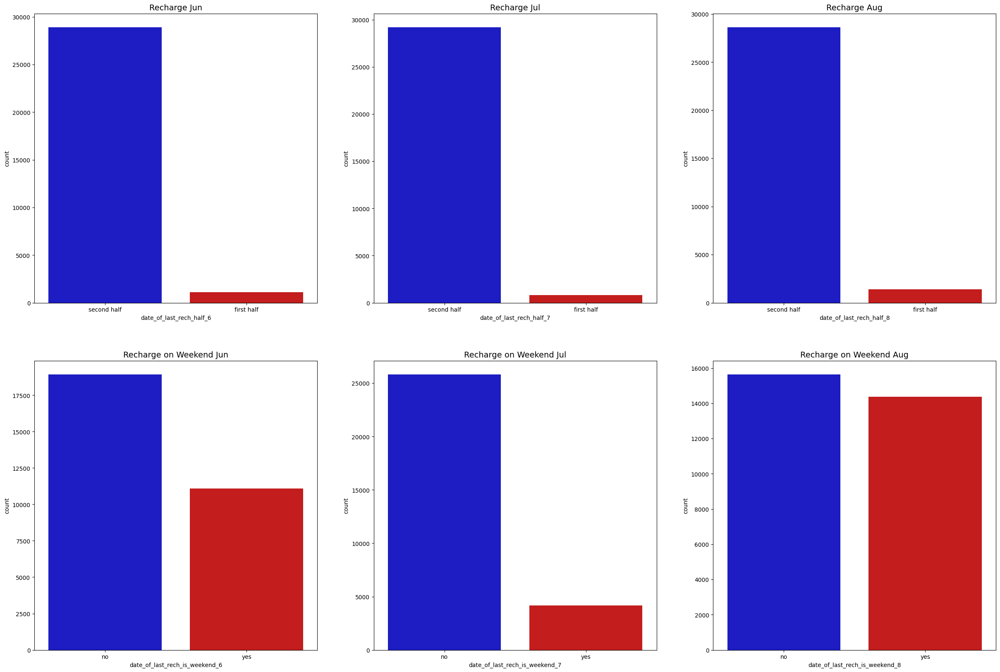

In [59]:
colors = ["#0101DF", "#DF0101"]
plt.figure(figsize=[30,20])
plt.subplot(2,3,1)
sns.countplot(x='date_of_last_rech_half_6', data=data_hv, palette=colors)
plt.title('Recharge Jun', fontsize=14)
plt.subplot(2,3,2)
sns.countplot(x='date_of_last_rech_half_7', data=data_hv, palette=colors)
plt.title('Recharge Jul', fontsize=14)
plt.subplot(2,3,3)
sns.countplot(x='date_of_last_rech_half_8', data=data_hv, palette=colors)
plt.title('Recharge Aug', fontsize=14)
plt.subplot(2,3,4)
sns.countplot(x='date_of_last_rech_is_weekend_6', data=data_hv, palette=colors)
plt.title('Recharge on Weekend Jun', fontsize=14)
plt.subplot(2,3,5)
sns.countplot(x='date_of_last_rech_is_weekend_7', data=data_hv, palette=colors)
plt.title('Recharge on Weekend Jul', fontsize=14)
plt.subplot(2,3,6)
sns.countplot(x='date_of_last_rech_is_weekend_8', data=data_hv, palette=colors)
plt.title('Recharge on Weekend Aug', fontsize=14)
plt.show()

### The observations are
1. Most of the users have recharged in the second half of the month
2. Users have recharged on weekends more in the month of Aug even though recharges on weekdays are more. Still it is relatively close in Aug.
3. We can see a good recharge rate on weekends(only 2 days compared to 5 weekdays).

#### Plot categorical variables agains churn

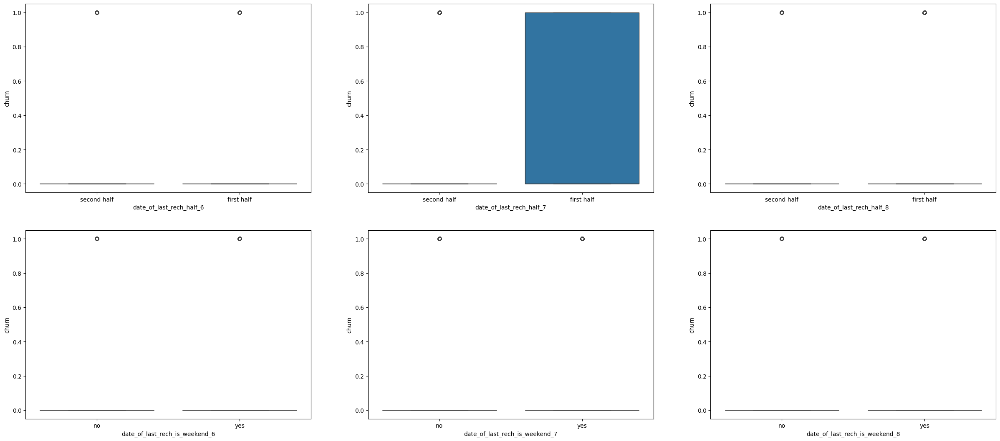

In [60]:
plt.figure(figsize=(30, 20))
plt.subplot(3,3,1)
sns.boxplot(x = 'date_of_last_rech_half_6', y = 'churn', data = data_hv)
plt.subplot(3,3,2)
sns.boxplot(x = 'date_of_last_rech_half_7', y = 'churn', data = data_hv)
plt.subplot(3,3,3)
sns.boxplot(x = 'date_of_last_rech_half_8', y = 'churn', data = data_hv)
plt.subplot(3,3,4)
sns.boxplot(x = 'date_of_last_rech_is_weekend_6', y = 'churn', data = data_hv)
plt.subplot(3,3,5)
sns.boxplot(x = 'date_of_last_rech_is_weekend_7', y = 'churn', data = data_hv)
plt.subplot(3,3,6)
sns.boxplot(x = 'date_of_last_rech_is_weekend_8', y = 'churn', data = data_hv)
plt.show()

In [61]:
numerical = list(set(data_hv.select_dtypes(include=['float64', 'int32'])))
numerical

['std_og_t2c_mou_7',
 'spl_ic_mou_7',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2f_mou_6',
 'vol_3g_mb_7',
 'avg_data_usage_mb_8',
 'std_ic_t2o_mou_8',
 'isd_ic_mou_6',
 'vol_2g_mb_6',
 'loc_og_t2t_mou_6',
 'spl_ic_mou_6',
 'std_og_mou_7',
 'loc_og_t2c_mou_6',
 'isd_og_mou_6',
 'onnet_mou_6',
 'loc_og_t2t_mou_7',
 'std_ic_t2f_mou_6',
 'avg_data_usage_mb_7',
 'onnet_mou_7',
 'spl_og_mou_7',
 'vol_2g_mb_8',
 'std_ic_t2f_mou_8',
 'aug_vbc_3g',
 'std_ic_t2m_mou_6',
 'onnet_mou_8',
 'std_og_t2o_mou',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2m_mou_6',
 'std_og_t2t_mou_6',
 'loc_ic_mou_8',
 'std_ic_t2t_mou_8',
 'roam_ic_mou_6',
 'vol_3g_mb_6',
 'std_ic_t2f_mou_7',
 'std_ic_mou_7',
 'loc_og_t2m_mou_6',
 'std_og_t2t_mou_8',
 'std_ic_mou_8',
 'vol_3g_mb_8',
 'total_ic_mou_6',
 'std_og_t2m_mou_8',
 'roam_ic_mou_8',
 'jul_vbc_3g',
 'std_og_mou_8',
 'loc_og_t2f_mou_7',
 'std_og_t2m_mou_7',
 'ic_others_8',
 'arpu_6',
 'loc_og_t2m_mou_8',
 'offnet_mou_6',
 'std_og_mou_6',
 'avg_recharge_good_phase',
 'loc_og_mou_7',
 's

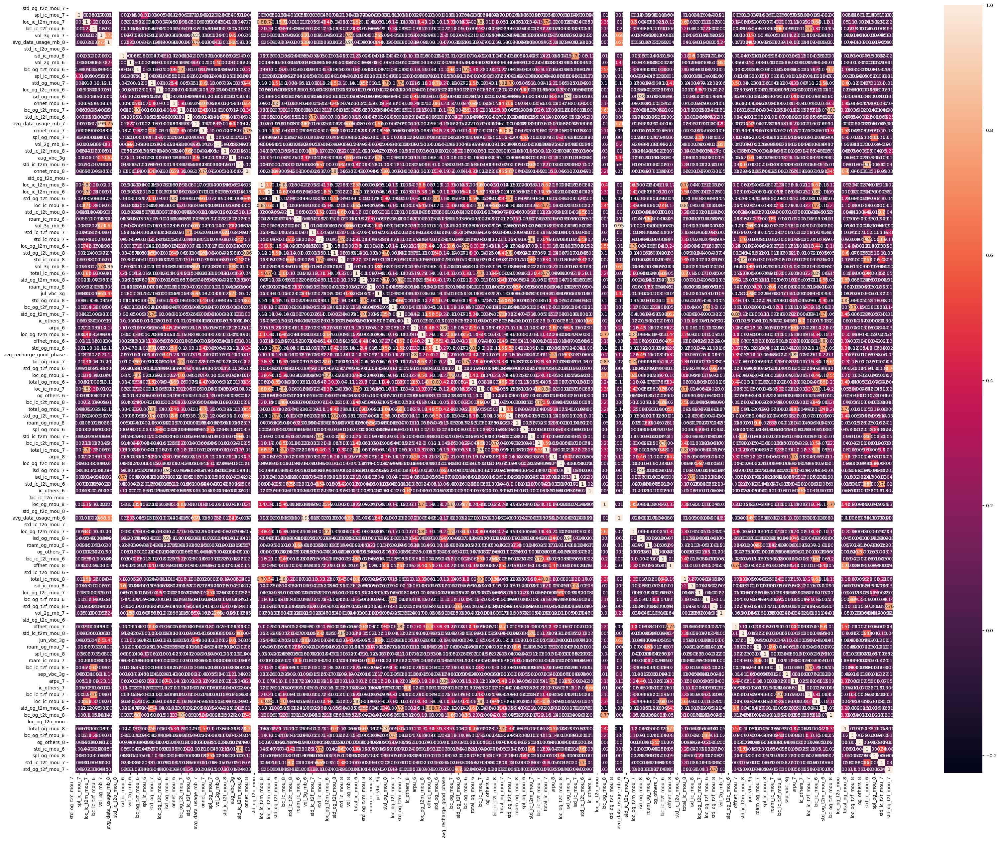

In [62]:
plt.figure(figsize=[40,30])
sns.heatmap(data_hv[numerical].corr(), annot=True)
plt.show()

### Find correlated element greater than 0.5

In [63]:
correlation_matrix = data_hv[numerical].corr()
high_correlation = correlation_matrix.unstack().sort_values(ascending=False)

# Filter out self-correlations (correlation of a variable with itself)
high_correlation = high_correlation[high_correlation != 1]

# Select only pairs with high correlation
high_correlation_upper = high_correlation[high_correlation > 0.5]
high_correlation_lower = high_correlation[high_correlation < -0.5]
print(len(high_correlation_upper))
print(len(high_correlation_lower))

494
0


In [490]:
high_correlation_upper

avg_data_usage_mb_8  vol_3g_mb_8            0.955455
vol_3g_mb_8          avg_data_usage_mb_8    0.955455
vol_3g_mb_6          avg_data_usage_mb_6    0.953784
avg_data_usage_mb_6  vol_3g_mb_6            0.953784
avg_data_usage_mb_7  vol_3g_mb_7            0.951475
                                              ...   
aug_vbc_3g           vol_3g_mb_7            0.501474
loc_og_t2m_mou_6     loc_ic_t2m_mou_6       0.500935
loc_ic_t2m_mou_6     loc_og_t2m_mou_6       0.500935
loc_og_t2m_mou_8     loc_ic_t2m_mou_8       0.500537
loc_ic_t2m_mou_8     loc_og_t2m_mou_8       0.500537
Length: 494, dtype: float64

#### There are many columns with high correlation which can be solved using PCA in the coming steps.

### One hot encoding for categorical columns

In [64]:
categorical = list(set(data_hv.select_dtypes(include=['object']).columns))
categorical

['date_of_last_rech_is_weekend_6',
 'date_of_last_rech_is_weekend_8',
 'date_of_last_rech_half_7',
 'date_of_last_rech_is_weekend_7',
 'date_of_last_rech_half_6',
 'date_of_last_rech_half_8']

In [65]:
cat_dummies = pd.get_dummies(data_hv[categorical], drop_first=True, dtype=int)
cat_dummies

,date_of_last_rech_is_weekend_6_yes,date_of_last_rech_is_weekend_8_yes,date_of_last_rech_half_7_second half,date_of_last_rech_is_weekend_7_yes,date_of_last_rech_half_6_second half,date_of_last_rech_half_8_second half
7,0,0,1,0,1,1
8,0,1,1,0,1,1
13,0,1,1,0,1,1
16,0,0,1,0,1,0
17,0,0,1,0,1,1
...,...,...,...,...,...,...
99970,0,1,1,0,1,1
99974,1,1,1,1,1,1
99986,0,0,1,0,1,1
99988,0,0,1,0,1,1


In [66]:
cat_dummies.shape

(30011, 6)

In [67]:
data_hv = pd.concat([data_hv, cat_dummies], axis=1)
data_hv.shape

(30011, 153)

In [68]:
data_hv.drop(categorical, axis=1, inplace=True)

In [69]:
data_hv.shape

(30011, 147)

### We will check the percentage of churn and non-churn

In [70]:
data_hv['churn'].value_counts(normalize=True) * 100

churn
0    91.359835
1     8.640165
Name: proportion, dtype: float64

Text(0.5, 1.0, 'Class Distributions \n (0: Non Churn || 1: Churn)')

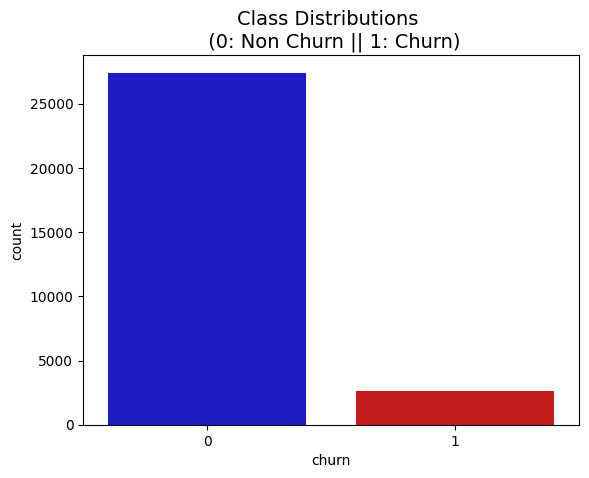

In [71]:
colors = ["#0101DF", "#DF0101"]

sns.countplot(x='churn', data=data_hv, palette=colors)
plt.title('Class Distributions \n (0: Non Churn || 1: Churn)', fontsize=14)

### It shows as class imbalance issue as there is only 8 percantage of churn customers.
#### Even if we go by a simple model we will get 91 percentage accuracy. We need to fix the class imbalance issue.

## Handle imbalanced class
#### We will handle class imabalance first and the do PCA to reduce dimensionality
We can handle imbalanced classes by balancing the classes by increasing minority or decreasing majority.
We can do that by following few techniques

- Random Under-Sampling
- Random Over-Sampling
- SMOTE - Synthetic Minority Oversampling Technique
- ADASYN - Adaptive Synthetic Sampling Method
- SMOTETomek - Over-sampling followed by under-sampling

### Train-Test split

In [72]:
from sklearn.model_selection import train_test_split

In [73]:
X = data_hv.drop(['churn', 'mobile_number'], axis=1)
y = data_hv['churn']

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [75]:
X_train.shape

(21007, 145)

In [76]:
y_train.shape

(21007,)

In [77]:
X_test.shape

(9004, 145)

In [78]:
y_test.shape

(9004,)

### We will do a basic LogisticRegression and check the evaluations metrics

In [79]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
lreg = LogisticRegression()
lreg.fit(X_train, y_train)

LogisticRegression()

In [80]:
y_pred = lreg.predict(X_test)
print ('Accuracy: ', accuracy_score(y_test, y_pred))
print ('F1 score: ', f1_score(y_test, y_pred))
print ('Recall: ', recall_score(y_test, y_pred))
print ('Precision: ', precision_score(y_test, y_pred))
print ('\n clasification report:\n', classification_report(y_test,y_pred))
print ('\n confussion matrix:\n',confusion_matrix(y_test, y_pred))

Accuracy:  0.937027987561084
F1 score:  0.48501362397820164
Recall:  0.34675324675324676
Precision:  0.8066465256797583

 clasification report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97      8234
           1       0.81      0.35      0.49       770

    accuracy                           0.94      9004
   macro avg       0.87      0.67      0.73      9004
weighted avg       0.93      0.94      0.93      9004


 confussion matrix:
 [[8170   64]
 [ 503  267]]


### The recall is very low due to the class imbalance which is not good for our objective. It will not properly find out churners.

### Class Imbalance techniques

In [81]:
# import sampling libraries
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import TomekLinks
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from imblearn.combine import SMOTETomek

In [180]:
# Import scaler and model libraries
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

#### Undersampling

In [83]:
under_sample = RandomUnderSampler(random_state = 5)
X_resampled_us, y_resampled_us = under_sample.fit_resample(X_train, y_train)
len(X_resampled_us)

3646

#### Tomek

In [84]:
tomek_sample = TomekLinks(sampling_strategy='majority')
X_resampled_tomek, y_resampled_tomek = tomek_sample.fit_resample(X_train, y_train)
len(X_resampled_tomek)

20675

#### Random OverSampling

In [85]:
over_sample = RandomOverSampler(sampling_strategy = 1)
X_resampled_os, y_resampled_os = over_sample.fit_resample(X_train, y_train)
len(X_resampled_os)

38368

#### SMOTE

In [86]:
smt = SMOTE(random_state=45, k_neighbors=5)
X_resampled_smt, y_resampled_smt = smt.fit_resample(X_train, y_train)
len(X_resampled_smt)

38368

#### ADASYN

In [87]:
ada = ADASYN(random_state=45, n_neighbors=5)
X_resampled_ada, y_resampled_ada = ada.fit_resample(X_train, y_train)
len(X_resampled_ada)

38911

#### SMOTE + TOMEK

In [88]:
smt_tmk = SMOTETomek(random_state=45)
X_resampled_smt_tmk, y_resampled_smt_tmk = smt_tmk.fit_resample(X_train, y_train)
len(X_resampled_smt_tmk)

38308

### We will create a function which will loop through
- LogisticRegression
- DecisionTree
- RandomForest

#### It will find the metrics
- Accuracy
- Precision
- Recall
- F1 Score

#### For
- Base (Without sampling)
- Random Undersampling
- TOMEK
- Random Oversampling
- SMOTE
- ADASYN
- SMOTE+TOMEK

### It will only do scaling for LogisticRegression as Tree based models will split data based on thresholds for each feature independently

### It will also print the metrics and classification report of all the combinations below.
## The function will also create a dataframe which contains the metrics of all the combinations which can be seen at the bottom.

In [145]:
def check_sampled_data_on_models(fn):
    print('\n----------------------------------------------------------------')
    print(fn[2])
    print('\n----------------------------------------------------------------')

    #Base model
    model_fn_base = fn[0]
    if fn[1] == True: # LogisticRegression only has this condition as True
        scaler_base = StandardScaler()
        X_train_scaled = scaler_base.fit_transform(X_train)
        X_test_scaled = scaler_base.transform(X_test) # Ensure test is also scaled. We only transform test data.
        model_fn_base.fit(X_train_scaled, y_train)
        y_pred_base = model_fn_base.predict(X_test_scaled)
    else:
        model_fn_base.fit(X_train, y_train)
        y_pred_base = model_fn_base.predict(X_test)

    #Random Undersampling
    model_fn_us = fn[0]
    if fn[1] == True:
        scaler_us = StandardScaler()
        X_resampled_scaled_us = scaler_us.fit_transform(X_resampled_us)
        X_test_scaled = scaler_us.transform(X_test)  # Ensure test is also scaled. 
        model_fn_us.fit(X_resampled_scaled_us, y_resampled_us)
        y_pred_us = model_fn_us.predict(X_test_scaled)
    else:
        model_fn_us.fit(X_resampled_us, y_resampled_us)
        y_pred_us = model_fn_us.predict(X_test)

    #Tomek
    model_fn_tomek = fn[0]
    if fn[1] == True:
        scaler_tomek = StandardScaler()
        X_resampled_scaled_tomek = scaler_tomek.fit_transform(X_resampled_tomek)
        X_test_scaled = scaler_tomek.transform(X_test)  # Ensure test is also scaled
        model_fn_tomek.fit(X_resampled_scaled_tomek, y_resampled_tomek)
        y_pred_tomek = model_fn_tomek.predict(X_test_scaled)
    else:
        model_fn_tomek.fit(X_resampled_tomek, y_resampled_tomek)
        y_pred_tomek = model_fn_tomek.predict(X_test)

    #Random Oversampling
    model_fn_os = fn[0]
    if fn[1] == True:
        scaler_os = StandardScaler()
        X_resampled_scaled_os = scaler_os.fit_transform(X_resampled_os)
        X_test_scaled = scaler_os.transform(X_test)  # Ensure test is also scaled
        model_fn_os.fit(X_resampled_scaled_os, y_resampled_os)
        y_pred_os = model_fn_os.predict(X_test_scaled)
    else:
        model_fn_os.fit(X_resampled_os, y_resampled_os)
        y_pred_os = model_fn_os.predict(X_test)

    #SMOTE
    model_fn_smt = fn[0]
    if fn[1] == True:
        scaler_smt = StandardScaler()
        X_resampled_scaled_smt = scaler_smt.fit_transform(X_resampled_smt)
        X_test_scaled = scaler_smt.transform(X_test)  # Ensure test is also scaled
        model_fn_smt.fit(X_resampled_scaled_smt, y_resampled_smt)
        y_pred_smt = model_fn_smt.predict(X_test_scaled)
    else:
        model_fn_smt.fit(X_resampled_smt, y_resampled_smt)
        y_pred_smt = model_fn_smt.predict(X_test)

    #ADASYN
    model_fn_ada = fn[0]
    if fn[1] == True:
        scaler_ada = StandardScaler()
        X_resampled_scaled_ada = scaler_ada.fit_transform(X_resampled_ada)
        X_test_scaled = scaler_ada.transform(X_test)  # Ensure test is also scaled
        model_fn_ada.fit(X_resampled_scaled_ada, y_resampled_ada)
        y_pred_ada = model_fn_ada.predict(X_test_scaled)
    else:
        model_fn_ada.fit(X_resampled_ada, y_resampled_ada)
        y_pred_ada = model_fn_ada.predict(X_test)

    #SMOTE + TOMEK
    model_fn_smt_tmk = fn[0]
    if fn[1] == True:
        scaler_smt_tmk = StandardScaler()
        X_resampled_scaled_smt_tmk = scaler_smt_tmk.fit_transform(X_resampled_smt_tmk)
        X_test_scaled = scaler_smt_tmk.transform(X_test)  # Ensure test is also scaled
        model_fn_smt_tmk.fit(X_resampled_scaled_smt_tmk, y_resampled_smt_tmk)
        y_pred_smt_tmk = model_fn_smt_tmk.predict(X_test_scaled)
    else:
        model_fn_smt_tmk.fit(X_resampled_smt_tmk, y_resampled_smt_tmk)
        y_pred_smt_tmk = model_fn_smt_tmk.predict(X_test)

    predictions = [[y_pred_base, 'Base'],
                   [y_pred_us, 'Random Undersampling'],
                   [y_pred_tomek, 'Tomek'],
                   [y_pred_os, 'Random Oversampling'],
                   [y_pred_smt, 'SMOTE'],
                   [y_pred_ada, 'ADASYN'],
                   [y_pred_smt_tmk, 'SMOTE + TOMEK']]

    metrics_all = {}
    for prediction in predictions:
        print(prediction[1])
        print('---------------------------------------------------------')
        y_pred = prediction[0]
        metrics_data = {
            'Metric': ['Accuracy', 'F1 Score', 'Recall', 'Precision'],
            'Score': [
                accuracy_score(y_test, y_pred),
                f1_score(y_test, y_pred),
                recall_score(y_test, y_pred),
                precision_score(y_test, y_pred)
            ]
        }
        # Get 'LR' from 'LogisticRegression' and same for others
        abbreviation = ''.join([word[0] for word in fn[2] if word.isupper()])
        metrics_all.setdefault(abbreviation+'_Accuracy',[]).append(accuracy_score(y_test, y_pred))
        metrics_all.setdefault(abbreviation+'_Recall',[]).append(recall_score(y_test, y_pred))
        metrics_all.setdefault(abbreviation+'_Precision',[]).append(precision_score(y_test, y_pred))
        metrics_all.setdefault(abbreviation+'_F1Score',[]).append(f1_score(y_test, y_pred))
        # Create DataFrame for metrics
        metrics_df = pd.DataFrame(metrics_data)

        # Display the metrics table
        print("\nEvaluation Metrics:")
        print(metrics_df)

        # Confusion Matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        print("\nConfusion Matrix:\n", conf_matrix)

        # Classification Report
        class_report = classification_report(y_test, y_pred)
        print("\nClassification Report:\n", class_report)
        
    print('\n\n**************************************************************************')
    return metrics_all

In [149]:
# Each list has function as first element, Scaling required as second element, Name of the Model as third element
fns = [[LogisticRegression(random_state=100), True, 'LogisticRegression'],[DecisionTreeClassifier(random_state=42), False, 'DecisionTree'], [RandomForestClassifier(random_state=100), False, 'RandomForest']]

In [150]:
metrics_all = {}
metrics_all['Imbalance Method'] = ['Base', 'Random Undersampling', 'Tomek', 'Random Oversampling', 'SMOTE', 'ADASYN', 'SMOTE + TOMEK']
for fn in fns:
    x = check_sampled_data_on_models(fn)
    metrics_all = {**metrics_all, **x}
metrics_all_df = pd.DataFrame(metrics_all)
metrics_all_df


----------------------------------------------------------------
LogisticRegression

----------------------------------------------------------------
Base
---------------------------------------------------------

Evaluation Metrics:
      Metric     Score
0   Accuracy  0.937361
1   F1 Score  0.501767
2     Recall  0.368831
3  Precision  0.784530

Confusion Matrix:
 [[8156   78]
 [ 486  284]]

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97      8234
           1       0.78      0.37      0.50       770

    accuracy                           0.94      9004
   macro avg       0.86      0.68      0.73      9004
weighted avg       0.93      0.94      0.93      9004

Random Undersampling
---------------------------------------------------------

Evaluation Metrics:
      Metric     Score
0   Accuracy  0.842292
1   F1 Score  0.480234
2     Recall  0.851948
3  Precision  0.334353

Confusion Matrix:
 [[6928 1306]
 [ 

,Imbalance Method,LR_Accuracy,LR_Recall,LR_Precision,LR_F1Score,DT_Accuracy,DT_Recall,DT_Precision,DT_F1Score,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
0,Base,0.937361,0.368831,0.784530,0.501767,0.911040,0.516883,0.481258,0.498435,0.945358,0.484416,0.797009,0.602585
1,Random Undersampling,0.842292,0.851948,0.334353,0.480234,0.797090,0.825974,0.273079,0.410455,0.890715,0.855844,0.430157,0.572546
2,Tomek,0.937028,0.388312,0.756962,0.513305,0.911928,0.564935,0.487122,0.523151,0.946246,0.507792,0.788306,0.617694
3,Random Oversampling,0.849178,0.841558,0.343949,0.488320,0.918036,0.496104,0.521858,0.508655,0.945580,0.549351,0.747350,0.633234
4,SMOTE,0.866393,0.729870,0.360951,0.483025,0.890826,0.635065,0.410579,0.498725,0.940249,0.681818,0.641809,0.661209
5,ADASYN,0.847734,0.736364,0.326801,0.452695,0.889938,0.616883,0.405636,0.489438,0.939916,0.689610,0.637455,0.662508
6,SMOTE + TOMEK,0.866282,0.731169,0.360897,0.483262,0.889494,0.641558,0.407255,0.498235,0.940138,0.677922,0.642066,0.659507


- LR prefix for LogisticRegression
- DT prefix for DecisionTree
- RF prefix for RandomForest
### From the above data, we can see RandomForest giving better output with sampling method

In [152]:
metrics_all_df[['Imbalance Method', 'RF_Accuracy', 'RF_Recall', 'RF_Precision', 'RF_F1Score']]

,Imbalance Method,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
0,Base,0.945358,0.484416,0.797009,0.602585
1,Random Undersampling,0.890715,0.855844,0.430157,0.572546
2,Tomek,0.946246,0.507792,0.788306,0.617694
3,Random Oversampling,0.945580,0.549351,0.747350,0.633234
4,SMOTE,0.940249,0.681818,0.641809,0.661209
5,ADASYN,0.939916,0.689610,0.637455,0.662508
6,SMOTE + TOMEK,0.940138,0.677922,0.642066,0.659507


### The following combinations give good results for RandomForest

#### SMOTE

In [374]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'SMOTE'][['Imbalance Method', 'RF_Accuracy', 'RF_Recall', 'RF_Precision', 'RF_F1Score']]

,Imbalance Method,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
4,SMOTE,0.940249,0.681818,0.641809,0.661209


#### ADASYN

In [375]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'ADASYN'][['Imbalance Method', 'RF_Accuracy', 'RF_Recall', 'RF_Precision', 'RF_F1Score']]

,Imbalance Method,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
5,ADASYN,0.939916,0.68961,0.637455,0.662508


#### SMOTE + TOMEK

In [376]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'SMOTE + TOMEK'][['Imbalance Method', 'RF_Accuracy', 'RF_Recall', 'RF_Precision', 'RF_F1Score']]

,Imbalance Method,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
6,SMOTE + TOMEK,0.940138,0.677922,0.642066,0.659507


-----------------------------------------------------------------
### The below model of RandomForest with Random Undersampling has high recall which means that the model identifies churners correctly.
- It has low Precision which means that it identifies non-churners as churners.
- So if the company has the budget and is fine with spending money on non-churners, we can also go ahead with the model below.
#### Random Undersampling

In [377]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'Random Undersampling'][['Imbalance Method', 'RF_Accuracy', 'RF_Recall', 'RF_Precision', 'RF_F1Score']]

,Imbalance Method,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
1,Random Undersampling,0.890715,0.855844,0.430157,0.572546


#### We can go with the above model if the company is fine with the budget. We are not considering this model as of now but we can try to do a hyperparameter tuning on this model to see whether other scores increase at the end of the notebook.

-----------------------------------------------------------------------------------------------------------------------------------

# Currently, We will go with RandomForest and SMOTE as it has good Accuracy, Recall, Precision, and F1 Score.

## PCA to reduce dimensionality
----------------------------
Principal Component Analysis (PCA) is a dimensionality reduction technique used in machine learning and statistics. It transforms the original set of features into a new set of linearly uncorrelated variables called principal components. These components capture the maximum variance in the data, with the first principal component explaining the most variance and so on.

We are taking resampled SMOTE samples

In [153]:
X_resampled_smt.shape

(38368, 145)

### For PCA to work, we need to standardize the data
#### We are standardizing balanced data created by SMOTE

In [154]:
scaler_smt = StandardScaler()
X_resampled_scaled_smt = scaler_smt.fit_transform(X_resampled_smt)
X_test_scaled = scaler_smt.transform(X_test) # We do transform for test data

In [155]:
from sklearn.decomposition import PCA
pca = PCA(random_state=42)

In [156]:
pca.fit(X_resampled_scaled_smt)

PCA(random_state=42)

### Components from the PCA

In [157]:
pca.components_

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         1.76302820e-02,  3.42340909e-03,  1.94570880e-02],
       [-0.00000000e+00, -0.00000000e+00, -0.00000000e+00, ...,
        -2.50563495e-02,  4.05105762e-02,  3.44319290e-02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         3.00699487e-03, -1.48034174e-02,  1.03526776e-02],
       ...,
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        -6.73763313e-13,  1.24382743e-12, -1.46509103e-13],
       [-0.00000000e+00, -0.00000000e+00, -0.00000000e+00, ...,
        -1.05346359e-13, -4.19584740e-13, -1.07189518e-14],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         1.36771264e-12, -2.40559584e-12, -6.93826277e-14]])

#### Looking at the explained variance ratio for each component

In [158]:
pca.explained_variance_ratio_

array([9.42887060e-02, 7.60020734e-02, 6.04407369e-02, 4.04825355e-02,
       3.92172720e-02, 3.27838147e-02, 3.11258085e-02, 2.75075231e-02,
       2.48995086e-02, 2.36865328e-02, 2.26262264e-02, 2.09353105e-02,
       1.92870356e-02, 1.89250134e-02, 1.83605393e-02, 1.73375854e-02,
       1.61596803e-02, 1.51839484e-02, 1.47912982e-02, 1.45980743e-02,
       1.31980602e-02, 1.28108664e-02, 1.19591364e-02, 1.14072098e-02,
       1.02214058e-02, 9.97173764e-03, 9.52280613e-03, 9.20435450e-03,
       8.76853084e-03, 8.61057005e-03, 8.50331233e-03, 8.15933638e-03,
       7.69056543e-03, 7.42535657e-03, 7.37293392e-03, 7.29068671e-03,
       7.16175904e-03, 7.11400316e-03, 7.01086457e-03, 6.83137465e-03,
       6.67074499e-03, 6.41539628e-03, 6.33581294e-03, 6.20997909e-03,
       5.90613069e-03, 5.66955237e-03, 5.59598559e-03, 5.37175515e-03,
       5.35378186e-03, 5.14180973e-03, 4.97908640e-03, 4.87272663e-03,
       4.83755205e-03, 4.63294121e-03, 4.44251121e-03, 4.34318264e-03,
      

#### Making a scree plot for the explained variance

In [159]:
explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

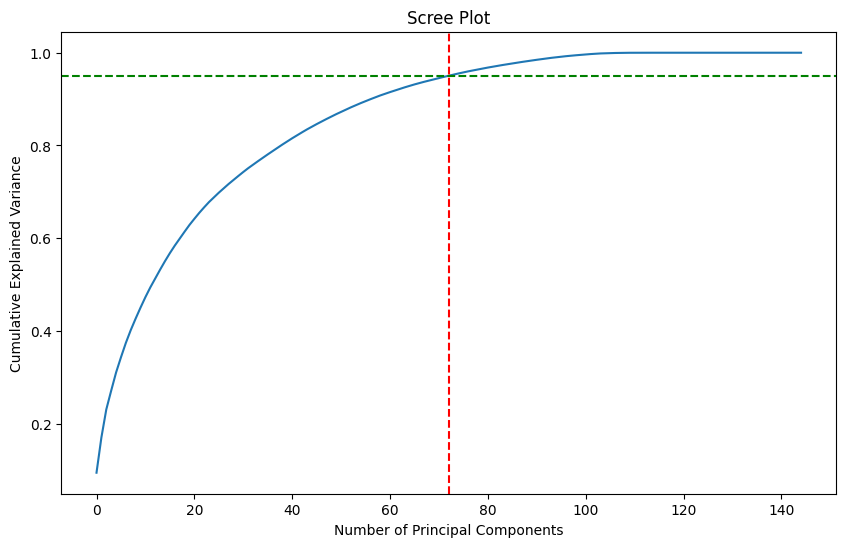

In [160]:
plt.figure(figsize=(10, 6))
plt.plot(explained_variance_ratio)
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(y=0.95, color='g', linestyle='--')  # Highlight the 95% threshold if needed
plt.axvline(x=np.argmax(explained_variance_ratio >= 0.95), color='r', linestyle='--')  # Mark the best number of components
plt.show()

In [161]:
np.argmax(explained_variance_ratio >= 0.95)

np.int64(72)

### We can perform PCA with 72 components

In [162]:
from sklearn.decomposition import IncrementalPCA

In [163]:
pca_final = IncrementalPCA(n_components=72)# We can use PCA also. IncrementalPCA is for large datasets.

In [164]:
X_train_pca = pca_final.fit_transform(X_resampled_scaled_smt)

In [165]:
X_train_pca.shape

(38368, 72)

In [166]:
corrmat = np.corrcoef(X_train_pca.transpose())

In [167]:
corrmat.shape

(72, 72)

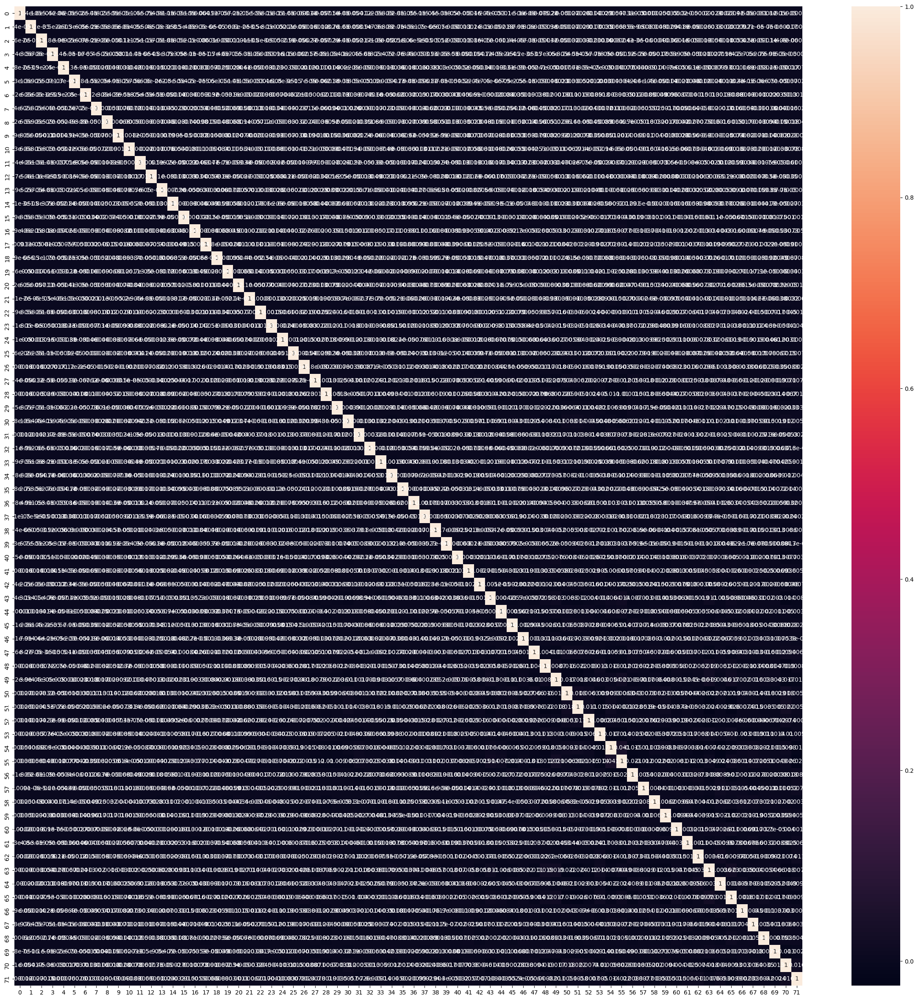

In [168]:
plt.figure(figsize=[30,30])
sns.heatmap(corrmat, annot=True)
plt.show()

### PCA effectively handled multicollinearity by creating uncorrelated principal components.

In [173]:
X_test_pca = pca_final.transform(X_test_scaled)
X_test_pca.shape

(9004, 72)

In [235]:
y_test.shape

(9004,)

## Applying RandomForest on the data on our Principal components
-----------------------------------
<b>Note:</b> RandomForest is capable of handling high-dimensional data, irrelevant features, and multicollinearity. PCA is better suited for models like Logistic Regression or SVM, where dimensionality and multicollinearity can be more problematic. We will still go ahead with PCA for RandomForest and see its impact.

At the end of the notebook, we will use PCA with LogisticRegression.

In [216]:
X_train_pca.shape

(38368, 72)

In [217]:
y_resampled_smt.shape

(38368,)

In [171]:
rf = RandomForestClassifier(random_state=100, oob_score=True)
rf.fit(X_train_pca, y_resampled_smt)

RandomForestClassifier(oob_score=True, random_state=100)

#### OOB Score

In [206]:
rf.oob_score_

0.9477429107589658

### Below is a function to print required metrics like Confusion Matrix, Accuracy, Recall, Precision, F1-Score

In [208]:
def print_metrics(y_actual, y_pred):
    metrics_data = {
        'Metric': ['Accuracy', 'F1 Score', 'Recall', 'Precision'],
        'Score': [
            accuracy_score(y_actual, y_pred),
            f1_score(y_actual, y_pred),
            recall_score(y_actual, y_pred),
            precision_score(y_actual, y_pred)
        ]
    }

    # Create DataFrame for metrics
    metrics_df = pd.DataFrame(metrics_data)
    
    # Display the metrics table
    print("\nEvaluation Metrics:")
    print(metrics_df)
    
    # Confusion Matrix
    conf_matrix = confusion_matrix(y_actual, y_pred)
    print("\nConfusion Matrix:\n", conf_matrix)
    
    # Classification Report
    class_report = classification_report(y_actual, y_pred)
    print("\nClassification Report:\n", class_report)

### We will predict the y values for test data

In [221]:
y_test_pred = rf.predict(X_test_pca)

In [222]:
y_test_pred_prob = rf.predict_proba(X_test_pca)[:, 1]

### Area under ROC curve

In [223]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob))

'0.88'

#### We have got a good area under ROC curve here.

## ROC curve plot

In [224]:
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve, auc

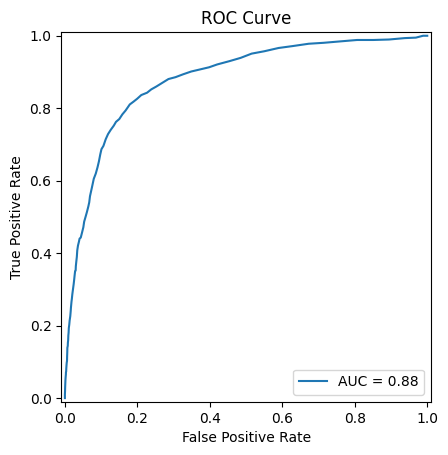

In [225]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [226]:
print_metrics(y_test, y_test_pred)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.904931
1   F1 Score  0.474201
2     Recall  0.501299
3  Precision  0.449883

Confusion Matrix:
 [[7762  472]
 [ 384  386]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95      8234
           1       0.45      0.50      0.47       770

    accuracy                           0.90      9004
   macro avg       0.70      0.72      0.71      9004
weighted avg       0.91      0.90      0.91      9004



#### Our evaluation metrics came down after PCA. We will check with hyperparameter tuning and see whether we will get good evaluation metrics.

## Hyper-parameter tuning for the Random Forest with PCA
----------------------------------------------------------

In [237]:
rf = RandomForestClassifier(random_state=100, n_jobs=-1)

In [238]:
params = {
    'max_depth': [2,3,5,10,20,30],
    'min_samples_leaf': [5,10,20,50,100,200,250,300],
    'n_estimators': [10, 25, 50, 100, 150, 200]
}

### Doing GridSearchCV for recall as we need to identify churners.

In [239]:
from sklearn.model_selection import GridSearchCV

In [240]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="recall")

In [241]:
%%time
grid_search.fit(X_train_pca, y_resampled_smt)

Fitting 4 folds for each of 288 candidates, totalling 1152 fits
CPU times: user 2min 12s, sys: 2.55 s, total: 2min 14s
Wall time: 32min 3s


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(n_jobs=-1, random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20, 30],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200, 250,
                                              300],
                         'n_estimators': [10, 25, 50, 100, 150, 200]},
             scoring='recall', verbose=1)

In [242]:
grid_search.best_score_

np.float64(0.9374999999999999)

In [243]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_estimators=200,
                       n_jobs=-1, random_state=100)

In [244]:
y_test_pred = rf_best.predict(X_test_pca)

In [245]:
y_test_pred_prob = rf_best.predict_proba(X_test_pca)[:, 1]

In [246]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob))

'0.88'

In [247]:
print_metrics(y_test, y_test_pred)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.901377
1   F1 Score  0.498871
2     Recall  0.574026
3  Precision  0.441118

Confusion Matrix:
 [[7674  560]
 [ 328  442]]

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95      8234
           1       0.44      0.57      0.50       770

    accuracy                           0.90      9004
   macro avg       0.70      0.75      0.72      9004
weighted avg       0.91      0.90      0.91      9004



### ROC Curve

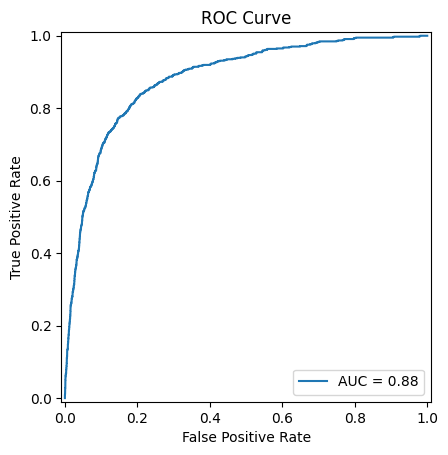

In [248]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

### The Recall before hyperparameter tuning is 0.501299 and after tuning is 0.574026.
### It has increased, but it is still less than what we got without PCA for RandomForest with SMOTE (0.681818)

### PCA is not helping much with RandomForest. We will do hyperparameter tuning on RandomForest without PCA and SMOTE balancing.
-------------------

# Gridsearch for RandomForest without PCA
----------------------

In [432]:
rf = RandomForestClassifier(random_state=100, n_jobs=-1)

In [433]:
params = {
    'max_depth': [2,3,5,10,20,30],
    'min_samples_leaf': [5,10,20,50,100,200,250,300],
    'n_estimators': [10, 25, 50, 100, 150, 200]
}

In [434]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="recall")

### SMOTE resampled data

In [435]:
X_resampled_smt.shape

(38368, 145)

In [436]:
y_resampled_smt.shape

(38368,)

In [437]:
%%time
grid_search.fit(X_resampled_smt, y_resampled_smt)

Fitting 4 folds for each of 288 candidates, totalling 1152 fits
CPU times: user 1min 47s, sys: 1min 33s, total: 3min 20s
Wall time: 25min 1s


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(n_jobs=-1, random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20, 30],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200, 250,
                                              300],
                         'n_estimators': [10, 25, 50, 100, 150, 200]},
             scoring='recall', verbose=1)

In [438]:
grid_search.best_score_

np.float64(0.9568390325271059)

### Find the best estimator

In [439]:
rf_best_without_pca = grid_search.best_estimator_
rf_best_without_pca

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1,
                       random_state=100)

In [440]:
y_train_pred = rf_best_without_pca.predict(X_resampled_smt)

In [441]:
print_metrics(y_resampled_smt, y_train_pred)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.983736
1   F1 Score  0.983844
2     Recall  0.990409
3  Precision  0.977366

Confusion Matrix:
 [[18744   440]
 [  184 19000]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98     19184
           1       0.98      0.99      0.98     19184

    accuracy                           0.98     38368
   macro avg       0.98      0.98      0.98     38368
weighted avg       0.98      0.98      0.98     38368



### Predict on test data

In [442]:
y_test_pred = rf_best_without_pca.predict(X_test)

In [443]:
y_test_pred_prob = rf_best_without_pca.predict_proba(X_test)[:, 1]

### Area under curve

In [444]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob))

'0.94'

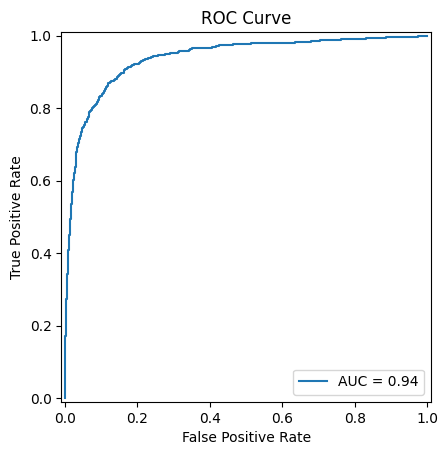

In [445]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

#### The area under ROC curve has increased from 0.88 to 0.94. The hyperparameter tuning has helped it.

### Evalution Metrics

In [446]:
print_metrics(y_test, y_test_pred)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.936806
1   F1 Score  0.662315
2     Recall  0.724675
3  Precision  0.609836

Confusion Matrix:
 [[7877  357]
 [ 212  558]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.96      0.97      8234
           1       0.61      0.72      0.66       770

    accuracy                           0.94      9004
   macro avg       0.79      0.84      0.81      9004
weighted avg       0.94      0.94      0.94      9004



## The Recall has increased from 0.6818 to 0.7246 which will help us to identify churners than the non-churners accurately.
## The above model is by far the best that we have got.
Recall = TP/(FN + TP)
#### False negative means the customer has actually churned but the model predicted as non-churn.
#### When false negatives reduce Recall increases which means we have identified churners more.

In [447]:
rf_best_without_pca.feature_importances_

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       3.10443183e-03, 4.21654150e-03, 2.80289559e-02, 2.74615756e-03,
       3.16174501e-03, 3.30403368e-03, 2.66177658e-03, 3.11318490e-03,
       4.54112746e-03, 3.33535404e-03, 1.16019342e-02, 1.37406010e-01,
       1.96944846e-03, 6.17414247e-03, 1.31251628e-01, 2.73223375e-03,
       2.57607994e-03, 8.91053498e-03, 2.68972427e-03, 3.95475301e-03,
       8.42849882e-03, 1.62406632e-03, 1.90865583e-03, 2.27719749e-03,
       2.23522553e-03, 4.18229284e-03, 5.28432454e-03, 2.69666725e-03,
       4.43591694e-03, 1.46649366e-02, 4.63570091e-03, 4.28113703e-03,
       3.37943511e-03, 2.57993126e-03, 3.63688367e-03, 2.38612771e-03,
       9.18325000e-04, 8.84983352e-04, 1.53759086e-03, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 3.33501310e-03, 3.67697408e-03,
       3.76622815e-03, 2.39017581e-03, 1.99223870e-03, 1.08572980e-02,
       5.28498657e-03, 7.27027392e-03, 3.52433344e-03, 4.38323678e-03,
      

In [448]:
imp_df = pd.DataFrame({
    "Feature": X_resampled_smt.columns,
    "Imp": rf_best_without_pca.feature_importances_
})
imp_df.sort_values(by="Imp", ascending=False)

,Feature,Imp
15,roam_ic_mou_8,0.137406
18,roam_og_mou_8,0.131252
90,total_ic_mou_8,0.055853
105,total_rech_amt_8,0.048551
108,max_rech_amt_8,0.039752
...,...,...
43,std_og_t2c_mou_6,0.000000
44,std_og_t2c_mou_7,0.000000
84,std_ic_t2o_mou_8,0.000000
82,std_ic_t2o_mou_6,0.000000


#### 20 Important features

In [449]:
imp_df.sort_values(by="Imp", ascending=False)[:20]

,Feature,Imp
15,roam_ic_mou_8,0.137406
18,roam_og_mou_8,0.131252
90,total_ic_mou_8,0.055853
105,total_rech_amt_8,0.048551
108,max_rech_amt_8,0.039752
111,last_day_rch_amt_8,0.039052
140,date_of_last_rech_is_weekend_8_yes,0.037969
60,total_og_mou_8,0.031482
6,arpu_8,0.028029
72,loc_ic_mou_8,0.016609


## We can use RFE to find the important features
#### To identify important predictor attributes which help the business understand indicators of churn

Currently, we are finding 20 important features using RFE.<br><br>
There are other options also to find the optimal features like
- RFECV (Recursive Feature Elimination with Cross-Validation)
- Combination of RFE and GridSearchCV

In [450]:
from sklearn.feature_selection import RFE

In [451]:
# Select top 20 features
rfe = RFE(estimator=rf_best_without_pca, n_features_to_select=20)
rfe.fit(X_resampled_smt, y_resampled_smt)

RFE(estimator=RandomForestClassifier(max_depth=20, min_samples_leaf=5,
                                     n_jobs=-1, random_state=100),
    n_features_to_select=20)

In [452]:
ranking = rfe.ranking_

In [453]:
ranking

array([126, 125, 124, 123,  15,   1,   1,  50,  24,  28,  52,  34,  45,
        73,  12,   1,  82,   2,   1,  44,  39,  23,  62,   8,  18,  85,
        78,  76,  75,  47,  60,  53,  31,   1,  32,  10,  25,  59,  43,
        64, 100, 101,  97, 120, 122, 121,  42,   1,  37,  66,  77,  14,
         6,   1,  29,  20, 115,   5,  36,  11,   1,  63,  61,  27,  56,
        26,   1,  74,  83,  55,  65,  19,   1,  33,  58,  80,  41,  57,
        40,  88,  94,  92, 118, 117, 119,  71,  70,  13,  46,   1,   1,
        16, 106,  72,  21,  84,  51,  54,  86,  81,  69,  35,   9,  38,
         4,   1,   1,  17,   1,   1,   1,   1,  93,  90,  68,  99,  91,
        48,  89,  98,  96, 109, 108, 102, 110, 107,  79, 113, 111, 116,
         3,  95, 105, 103, 104,  22,  87,  67,   7,  30,   1, 112,  49,
       114,   1])

In [454]:
selected_features = X_resampled_smt.columns[rfe.support_]

In [455]:
print("Selected Features:", selected_features)

Selected Features: Index(['arpu_7', 'arpu_8', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_mou_8',
       'std_og_mou_7', 'spl_og_mou_7', 'total_og_mou_8', 'loc_ic_t2m_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_8', 'last_day_rch_amt_6',
       'last_day_rch_amt_7', 'last_day_rch_amt_8',
       'date_of_last_rech_is_weekend_8_yes',
       'date_of_last_rech_half_8_second half'],
      dtype='object')


In [456]:
selected_features_df = pd.DataFrame(selected_features, columns=['Selected Features'])
selected_features_df

,Selected Features
0,arpu_7
1,arpu_8
2,roam_ic_mou_8
3,roam_og_mou_8
4,loc_og_mou_8
5,std_og_mou_7
6,spl_og_mou_7
7,total_og_mou_8
8,loc_ic_t2m_mou_8
9,loc_ic_mou_8


In [457]:
# Train the RandomForest on the selected features
rf_best_without_pca_selected_features = grid_search.best_estimator_
rf_best_without_pca_selected_features.fit(X_resampled_smt[selected_features], y_resampled_smt)

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1,
                       random_state=100)

#### Get the feature importances

In [458]:
feature_importances = rf_best_without_pca_selected_features.feature_importances_

In [459]:
features_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': feature_importances
})

In [460]:
features_importance_df = features_importance_df.sort_values(by='Importance', ascending=False)

### Plot the feature importance

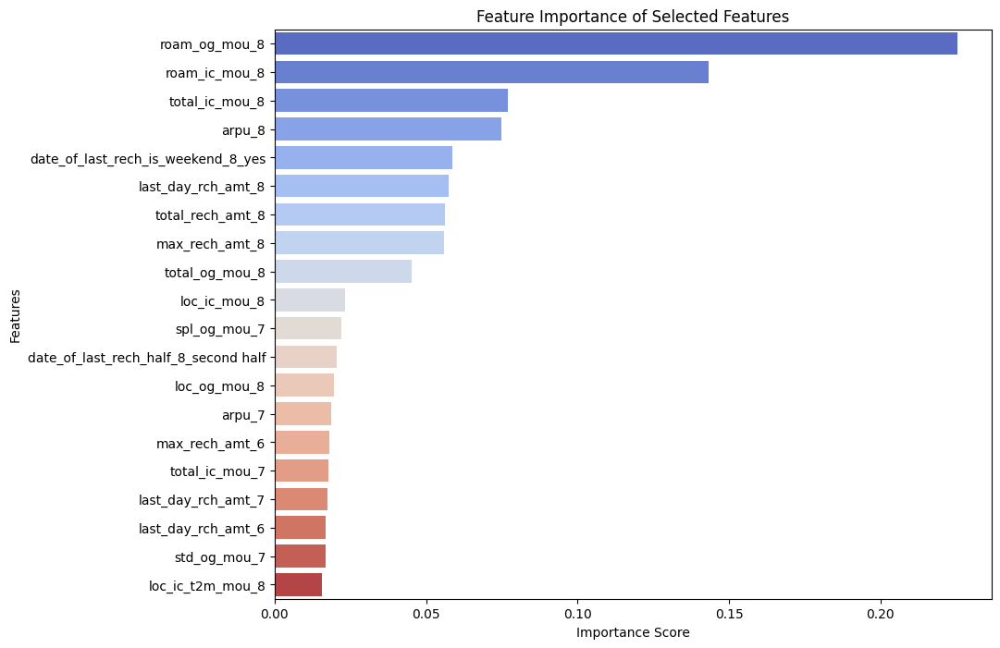

In [461]:
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=features_importance_df, palette='coolwarm')
plt.title('Feature Importance of Selected Features')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

In [462]:
y_test_pred = rf_best_without_pca_selected_features.predict(X_test[selected_features])

In [463]:
y_test_pred_prob = rf_best_without_pca_selected_features.predict_proba(X_test[selected_features])[:, 1]

### Area under curve

In [464]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob))

'0.93'

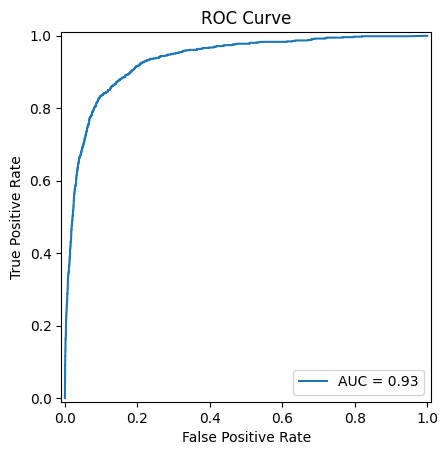

In [465]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [466]:
print_metrics(y_test, y_test_pred)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.921701
1   F1 Score  0.619536
2     Recall  0.745455
3  Precision  0.530009

Confusion Matrix:
 [[7725  509]
 [ 196  574]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.94      0.96      8234
           1       0.53      0.75      0.62       770

    accuracy                           0.92      9004
   macro avg       0.75      0.84      0.79      9004
weighted avg       0.94      0.92      0.93      9004



### The recall has increased from 0.7246 to 0.7454 after training the RandomForest with selected features through RFE.

## The 20 important features or predictor attributes which help the business to understand the churn. The company can focus on these attributes to reduce the churn rate.

### Selected Features
- arpu_7 - Average Revenue Per User for July
- arpu_8 - Average Revenue Per User for August
- roam_ic_mou_8 - Roaming Incoming for August
- roam_og_mou_8 - Roaming Outgoing for August
- loc_og_mou_8 - Local Outgoing for August
- std_og_mou_7 - STD Outgoing for July
- spl_og_mou_7- Special Calls Outgoing for July
- total_og_mou_8 - Total Outgoing for August
- loc_ic_t2m_mou_8 - Local Incoming Operator T to other operator mobile for August
- loc_ic_mou_8 - Local Incoming for August
- total_ic_mou_7 - Total Incoming for July
- total_ic_mou_8 - Total incoming for August
- total_rech_amt_8 - Total Recharge Amount for August
- max_rech_amt_6 - Maximum Recharge Amount for June
- max_rech_amt_8 - Maximum Recharge Amount for August
- last_day_rch_amt_6 - Last day recharge amount for June
- last_day_rch_amt_7 - Last day recharge amount for July
- last_day_rch_amt_8 - Last day recharge amount for August
- date_of_last_rech_is_weekend_8_yes - Date of last recharge is weekend for August
- date_of_last_rech_half_8_second half - Date of last recharge is in second half for August

# Recommend strategies to manage customer churn

1. <b>Revenue-Based Strategies</b><br>
- Feature: `arpu_7` & `arpu_8` (Average Revenue Per User for July and August)
- Strategy: Identify users whose ARPU has declined over time. Implement targeted offers and personalized promotions to boost their usage, such as bonus data or discounted call rates, depending on their preferences.
- Action: Segment customers by ARPU trends and offer rewards for maintaining or increasing spending.

2. <b>Roaming Usage Patterns</b><br>
- Feature: `roam_ic_mou_8` & `roam_og_mou_8` (Roaming Incoming/Outgoing Minutes for August)
- Strategy: Customers with high roaming usage might require specific plans to cater to their mobility. Introduce specialized roaming packs with - discounts, or notify them about available roaming packages to retain their loyalty.
- Action: Automatically enroll high roaming customers in roaming benefit programs or send reminders about international/local roaming benefits.

3. <b>Local & STD Call Patterns</b><br>
- Feature: `loc_og_mou_8`, `std_og_mou_7`, `spl_og_mou_7` (Local, STD, and Special Outgoing Calls)
- Strategy: Customers who make a large number of local and STD calls may benefit from customized voice calling plans. Introduce location based promotions or local/STD calling packs to reduce the chance of switching to another carrier for cheaper rates.
- Action: Send targeted campaigns offering lower call rates based on their usage type (local, STD, special calls).

4. <b>Recharge Behavior & Financial Offers</b><br>
- Feature: `total_rech_amt_8`, `max_rech_amt_6`, `max_rech_amt_8`, `last_day_rch_amt_6`, `last_day_rch_amt_7`, `last_day_rch_amt_8` (Recharge Amounts & Timing)
- Strategy: Understanding recharge patterns lets you detect customers who are recharging less frequently or with lower amounts. Offer cashback, bonuses, or rewards when recharges are low or delayed, especially around the month's end.
- Action: Implement bonus data or talk-time rewards for users who recharge with larger amounts or have missed recent recharges. Promote weekend recharge offers based on the last recharge day.

5. <b>Call Activity Monitoring</b><br>
- Feature: `total_og_mou_8`, `total_ic_mou_7`, `total_ic_mou_8` (Total Incoming/Outgoing Minutes)
- Strategy: Monitor users with reduced incoming and outgoing calls. These users might be on the verge of churning. Offer them call benefits or bonus talk time to encourage higher engagement.
- Action: Provide customized call packs for low-engagement users and monitor their usage trend after promotional campaigns.

7. <b>Recharge Day Optimization</b><br>
- Feature: `date_of_last_rech_is_weekend_8_yes`, `date_of_last_rech_half_8_second half` (Recharge Date Insights)
- Strategy: Customers recharging on weekends or in the second half of the month may benefit from timing-based offers. Implement promotions on weekends or provide special offers for customers recharging in the second half of the month.
- Action: Send targeted offers before weekends or mid-month, encouraging recharges with additional benefits like bonus data or extended validity.

### RFECV (Recursive Feature Elimination with Cross-Validation)
Adding the RFECV code below for reference as it is taking a lot of time to execute.

In [ ]:
# from sklearn.feature_selection import RFECV
# from sklearn.model_selection import StratifiedKFold

# rf_for_rfecv = RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1, random_state=100)
# rfecv = RFECV(estimator=grid_search.best_estimator_, step=1, cv=StratifiedKFold(5), scoring='recall', n_jobs=-1)
# rfecv.fit(X_resampled_smt, y_resampled_smt)

# optimal_n_features = rfecv.n_features_
# print(f'Optimal number of features: {optimal_n_features}')

### RandomForest with Random Undersampling
-----------------

#### Previous Metrics before hyperparameter tuning.

In [468]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'Random Undersampling'][['Imbalance Method', 'RF_Accuracy', 'RF_Recall', 'RF_Precision', 'RF_F1Score']]

,Imbalance Method,RF_Accuracy,RF_Recall,RF_Precision,RF_F1Score
1,Random Undersampling,0.890715,0.855844,0.430157,0.572546


In [471]:
rf_us = RandomForestClassifier(random_state=100, n_jobs=-1)

In [472]:
params = {
    'max_depth': [2,3,5,10,20,30],
    'min_samples_leaf': [5,10,20,50,100,200,250,300],
    'n_estimators': [10, 25, 50, 100, 150, 200]
}

In [473]:
grid_search_us = GridSearchCV(estimator=rf_us,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="recall")

#### Random Undersampled data

In [474]:
X_resampled_us.shape

(3646, 145)

In [475]:
y_resampled_us.shape

(3646,)

In [476]:
%%time
grid_search_us.fit(X_resampled_us, y_resampled_us)

Fitting 4 folds for each of 288 candidates, totalling 1152 fits
CPU times: user 21.3 s, sys: 14.3 s, total: 35.6 s
Wall time: 1min 57s


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(n_jobs=-1, random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20, 30],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200, 250,
                                              300],
                         'n_estimators': [10, 25, 50, 100, 150, 200]},
             scoring='recall', verbose=1)

In [477]:
grid_search_us.best_score_

np.float64(0.8228323211875844)

In [478]:
rf_best_us_without_pca = grid_search_us.best_estimator_
rf_best_us_without_pca

RandomForestClassifier(max_depth=20, min_samples_leaf=5, n_jobs=-1,
                       random_state=100)

### Predict on test data

In [480]:
y_test_pred_rf_us = rf_best_us_without_pca.predict(X_test)

In [481]:
y_test_pred_prob_rf_us = rf_best_us_without_pca.predict_proba(X_test)[:, 1]

#### Area under curve

In [482]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob_rf_us))

'0.94'

#### ROC curve

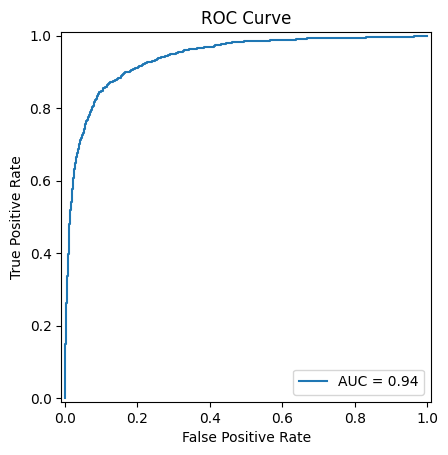

In [483]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob_rf_us)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

#### Evaluation Metrics

In [484]:
print_metrics(y_test, y_test_pred_rf_us)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.887717
1   F1 Score  0.565908
2     Recall  0.855844
3  Precision  0.422707

Confusion Matrix:
 [[7334  900]
 [ 111  659]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.89      0.94      8234
           1       0.42      0.86      0.57       770

    accuracy                           0.89      9004
   macro avg       0.70      0.87      0.75      9004
weighted avg       0.94      0.89      0.90      9004



### Recall remains the same after tuning the undersampled model. F1 Score increased.
We are not having any substantial improvement.

## LogisticRegression with PCA
------------------
#### We will do some additional models with LogisticRegression as PCA is better suited for models like Logistic Regression or SVM, where dimensionality and multicollinearity can be more problematic.

#### Previous metrics without PCA

In [312]:
metrics_all_df[['Imbalance Method', 'LR_Accuracy', 'LR_Recall', 'LR_Precision', 'LR_F1Score']]

,Imbalance Method,LR_Accuracy,LR_Recall,LR_Precision,LR_F1Score
0,Base,0.937361,0.368831,0.784530,0.501767
1,Random Undersampling,0.842292,0.851948,0.334353,0.480234
2,Tomek,0.937028,0.388312,0.756962,0.513305
3,Random Oversampling,0.849178,0.841558,0.343949,0.488320
4,SMOTE,0.866393,0.729870,0.360951,0.483025
5,ADASYN,0.847734,0.736364,0.326801,0.452695
6,SMOTE + TOMEK,0.866282,0.731169,0.360897,0.483262


### LogisticRegression with Random Undersampling and PCA
---------------

#### Previous metrics with Random Undersampling - without PCA

In [370]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'Random Undersampling'][['Imbalance Method', 'LR_Accuracy', 'LR_Recall', 'LR_Precision', 'LR_F1Score']]

,Imbalance Method,LR_Accuracy,LR_Recall,LR_Precision,LR_F1Score
1,Random Undersampling,0.842292,0.851948,0.334353,0.480234


#### Scaling the undersampled data

In [298]:
scaler_us = StandardScaler()
X_resampled_scaled_us = scaler_smt.fit_transform(X_resampled_us)
X_test_scaled = scaler_smt.transform(X_test) # We do transform for test data

In [299]:
X_resampled_scaled_us.shape

(3646, 145)

In [300]:
pca_lg = PCA(0.95)

In [301]:
X_train_lg_pca = pca_lg.fit_transform(X_resampled_scaled_us)

In [302]:
X_train_lg_pca.shape

(3646, 73)

In [331]:
X_test_lg_pca = pca_lg.transform(X_test_scaled)

### LogisticRegression

In [303]:
lg = LogisticRegression(random_state=100)

In [304]:
lg.fit(X_train_lg_pca, y_resampled_us)

LogisticRegression(random_state=100)

In [332]:
y_train_pred_lg_pca = lg.predict(X_train_lg_pca)

In [334]:
y_train_pred_prob_lg_pca = lg.predict_proba(X_train_lg_pca)[:, 1]

#### Area under curve of train data

In [335]:
"{:2.2}".format(metrics.roc_auc_score(y_resampled_us, y_train_pred_prob_lg_pca))

'0.89'

In [336]:
print_metrics(y_resampled_us, y_train_pred_lg_pca)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.826659
1   F1 Score  0.828261
2     Recall  0.835985
3  Precision  0.820679

Confusion Matrix:
 [[1490  333]
 [ 299 1524]]

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.82      0.83      1823
           1       0.82      0.84      0.83      1823

    accuracy                           0.83      3646
   macro avg       0.83      0.83      0.83      3646
weighted avg       0.83      0.83      0.83      3646



In [337]:
y_test_pred_lg_pca = lg.predict(X_test_lg_pca)

In [338]:
y_test_pred_prob_lg_pca = lg.predict_proba(X_test_lg_pca)[:, 1]

In [339]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob_lg_pca))

'0.89'

### ROC curve

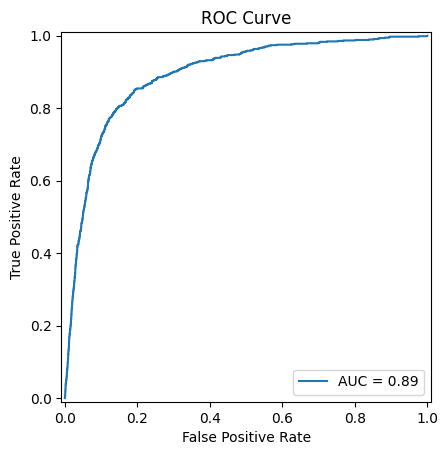

In [340]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob_lg_pca)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

### Evaluation Metrics

In [341]:
print_metrics(y_test, y_test_pred_lg_pca)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.806753
1   F1 Score  0.430255
2     Recall  0.853247
3  Precision  0.287653

Confusion Matrix:
 [[6607 1627]
 [ 113  657]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.80      0.88      8234
           1       0.29      0.85      0.43       770

    accuracy                           0.81      9004
   macro avg       0.64      0.83      0.66      9004
weighted avg       0.92      0.81      0.84      9004



### The Recall has not increased much even after the PCA. The model is a decent one when we consider recall.

### LogisticRegression with PCA and Random Oversampling
----------------------

#### Previous Metrics with random oversampling - without PCA

In [379]:
metrics_all_df[metrics_all_df['Imbalance Method'] == 'Random Oversampling'][['Imbalance Method', 'LR_Accuracy', 'LR_Recall', 'LR_Precision', 'LR_F1Score']]

,Imbalance Method,LR_Accuracy,LR_Recall,LR_Precision,LR_F1Score
3,Random Oversampling,0.849178,0.841558,0.343949,0.48832


#### Scaling the oversampled data

In [381]:
scaler_os = StandardScaler()
X_resampled_scaled_os = scaler_os.fit_transform(X_resampled_os)
X_test_scaled = scaler_os.transform(X_test) # We do transform for test data

In [382]:
X_resampled_scaled_os.shape

(38368, 145)

In [383]:
X_resampled_os.shape

(38368, 145)

In [384]:
pca_lg_os = PCA(0.95)

In [387]:
X_train_lg_os_pca = pca_lg_os.fit_transform(X_resampled_scaled_os)

In [388]:
X_train_lg_os_pca.shape

(38368, 73)

In [389]:
X_test_lg_os_pca = pca_lg_os.transform(X_test_scaled)

#### LogisticRegression

In [390]:
lg = LogisticRegression(random_state=100)
lg.fit(X_train_lg_os_pca, y_resampled_os)

LogisticRegression(random_state=100)

In [391]:
y_train_pred_lg_os_pca = lg.predict(X_train_lg_os_pca)

In [392]:
y_train_pred_prob_lg_os_pca = lg.predict_proba(X_train_lg_os_pca)[:, 1]

#### Area under curve of train data

In [393]:
"{:2.2}".format(metrics.roc_auc_score(y_resampled_os, y_train_pred_prob_lg_os_pca))

'0.89'

In [394]:
print_metrics(y_resampled_os, y_train_pred_lg_os_pca)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.823499
1   F1 Score  0.825410
2     Recall  0.834445
3  Precision  0.816568

Confusion Matrix:
 [[15588  3596]
 [ 3176 16008]]

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.81      0.82     19184
           1       0.82      0.83      0.83     19184

    accuracy                           0.82     38368
   macro avg       0.82      0.82      0.82     38368
weighted avg       0.82      0.82      0.82     38368



In [395]:
y_test_pred_lg_os_pca = lg.predict(X_test_lg_os_pca)

In [396]:
y_test_pred_prob_lg_os_pca = lg.predict_proba(X_test_lg_os_pca)[:, 1]

In [397]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_test_pred_prob_lg_os_pca))

'0.89'

### ROC curve

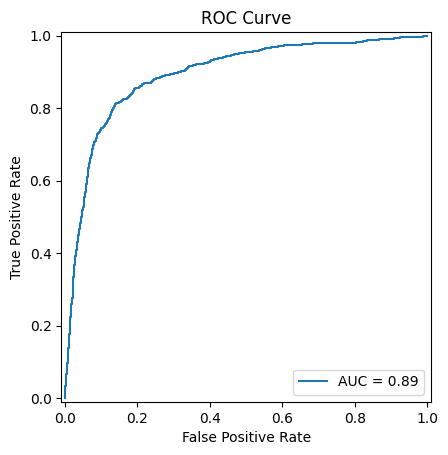

In [398]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_prob_lg_os_pca)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Create the ROC curve display
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

#### Evaluation Metrics

In [399]:
print_metrics(y_test, y_test_pred_lg_os_pca)


Evaluation Metrics:
      Metric     Score
0   Accuracy  0.813527
1   F1 Score  0.438274
2     Recall  0.850649
3  Precision  0.295178

Confusion Matrix:
 [[6670 1564]
 [ 115  655]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.81      0.89      8234
           1       0.30      0.85      0.44       770

    accuracy                           0.81      9004
   macro avg       0.64      0.83      0.66      9004
weighted avg       0.92      0.81      0.85      9004



### The recall has increased from 0.841558 to 0.850649. PCA has helped a little as it has reduced multicollinearity.